### Abstracto con motivación y audiencia


En los últimos años, los datos financieros se han convertido en un recurso vital para la toma de decisiones en el mundo empresarial. En particular, en el sector financiero, el análisis de datos se ha convertido en una herramienta clave para mejorar la eficiencia operativa y la rentabilidad de las empresas. Consciente de esta realidad, me he propuesto crear una investigación de datos financieros que me permita mejorar mi posición laboral y, al mismo tiempo, crear un servicio que pueda ser de gran valor para la empresa financiera en la que trabajo.

Mi motivación para llevar a cabo esta investigación surge de mi interés por la aplicación de tecnologías innovadoras en el ámbito financiero. En mi experiencia profesional, he visto cómo la capacidad de análisis de datos ha permitido a las empresas financieras mejorar su eficiencia operativa y, por ende, aumentar su rentabilidad. En este sentido, considero que el análisis de datos es una herramienta clave para enfrentar los desafíos del sector financiero y mejorar su competitividad.

Por otro lado, como empleado de una empresa financiera, estoy interesado en mejorar mi posición laboral y tener mayores oportunidades de crecimiento profesional. Creo que el conocimiento y la habilidad para manejar datos financieros es un activo altamente valorado en la industria, por lo que considero que una investigación en esta área puede mejorar significativamente mis perspectivas de carrera.

En cuanto a la creación de un servicio en la empresa financiera en la que trabajo, considero que el análisis de datos puede ser de gran valor para nuestros clientes. Con el análisis de datos financieros, podemos identificar tendencias y patrones que pueden ser útiles para nuestros clientes en la toma de decisiones. Además, podemos crear modelos de predicción que les permitan tomar decisiones más informadas sobre sus inversiones.

Por todo lo expuesto, he decidido llevar a cabo una investigación de datos financieros que me permita mejorar mi posición laboral y, al mismo tiempo, crear un servicio de valor para la empresa financiera en la que trabajo. Mi objetivo es aplicar técnicas de análisis de datos a los datos financieros disponibles en la empresa y crear modelos predictivos que puedan ser utilizados por nuestros clientes.

Para llevar a cabo esta investigación, utilizaré herramientas de análisis de datos como R, Python y Tableau. Además, me basaré en técnicas de análisis de datos como el análisis de series temporales y la regresión lineal para crear modelos predictivos. Asimismo, trabajaré en colaboración con otros profesionales de la empresa para asegurarme de que mis hallazgos sean relevantes y útiles para la empresa.


### Preguntas/Problema que buscamos resolver

Una posible hipótesis podría ser que la falta de acceso a productos financieros y cobertura en la población vulnerable y sin historia crediticia en Colombia es un obstáculo para su inclusión financiera y que el diseño de un producto financiero innovador y accesible puede facilitar su acceso a servicios bancarios.

Esta hipótesis se basa en la idea de que las poblaciones vulnerables y sin historia crediticia en Colombia tienen dificultades para acceder a productos financieros tradicionales debido a la falta de garantías y al riesgo percibido por los proveedores de servicios financieros. Además, estas poblaciones a menudo carecen de los conocimientos y la educación financiera necesarios para utilizar productos financieros de manera efectiva.

La hipótesis podría sostener que el diseño de un producto financiero innovador y accesible, que tenga en cuenta las necesidades y limitaciones de estas poblaciones, puede facilitar su acceso a servicios bancarios. Este producto financiero podría incluir características como tasas de interés asequibles, requisitos de garantía flexibles y educación financiera integrada para ayudar a las poblaciones vulnerables a tomar decisiones financieras informadas.

Para probar esta hipótesis, se podría llevar a cabo una investigación sobre el acceso a productos financieros y cobertura en la población vulnerable y sin historia crediticia en Colombia, y la efectividad de los productos financieros existentes para abordar estas barreras. Además, se podría llevar a cabo una encuesta y entrevistas con las poblaciones vulnerables para entender sus necesidades y limitaciones financieras y cómo un producto financiero innovador y accesible podría ayudar a abordarlas.


#### Algunas preguntas que complementan esta hipótesis

1. ¿Cuál es la tasa de acceso a productos financieros y cobertura por género en la población vulnerable y sin historia crediticia en Colombia?
2. ¿Cuál es la correlación entre el nivel de educación y la tenencia de productos financieros y cobertura en la población vulnerable y sin historia crediticia en Colombia?
3. ¿Cuál es la relación entre la edad y la tenencia de productos financieros y cobertura en la población vulnerable y sin historia crediticia en Colombia?
4. ¿Qué productos financieros y cobertura son los más utilizados por la población vulnerable y sin historia crediticia en Colombia y cuáles son los menos utilizados?
5. ¿Cuál es la relación entre el acceso a productos financieros y cobertura y el bienestar financiero de la población vulnerable y sin historia crediticia en Colombia?

### Data Wrangling

In [131]:
#Listado de librerias a importar

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression



In [132]:
DATA_PATH = 'Inclusion_Financiera.csv'
data = pd.read_csv(DATA_PATH)

In [133]:
# Obtener el listado completo de columnas y tipos de datos
column_info = data.dtypes.reset_index()
column_info.columns = ['Columna', 'Tipo de Variable']

# Mostrar el listado completo de columnas y tipos de datos
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(column_info)


                                     Columna Tipo de Variable
0                            TIPO DE ENTIDAD            int64
1                      CODIGO DE LA  ENTIDAD            int64
2                      NOMBRE DE LA  ENTIDAD           object
3                             FECHA DE CORTE           object
4                          UNIDAD DE CAPTURA            int64
5                               DEPARTAMENTO           object
6                                    RENGLON            int64
7                                  MUNICIPIO           object
8                                       TIPO           object
9                 NRO CORRESPONSALES PROPIOS            int64
10           NRO CORRESPONSALES TERCERIZADOS            int64
11                NRO CORRESPONSALES ACTIVOS            int64
12                        NRO CORRESPONSALES            int64
13                             NRO DEPOSITOS            int64
14                           MONTO DEPOSITOS          float64
15      

#### Iniciamos el Data Wrangling

In [134]:
# Contar los valores faltantes por columna
datos_faltantes = data.isnull().sum()

# Mostrar las columnas con datos faltantes y la cantidad de valores faltantes en cada una
print(datos_faltantes[datos_faltantes > 0])


TIPO    5132
dtype: int64


In [135]:
valor_mas_frecuente = data['TIPO'].mode().iloc[0]
data['TIPO'].fillna(valor_mas_frecuente, inplace=True)


In [136]:
# Convertir las columnas específicas según las indicaciones
columnas_a_convertir = {
    'TIPO DE ENTIDAD': 'int64',
    'CODIGO DE LA  ENTIDAD': 'int64',
    'UNIDAD DE CAPTURA': 'int64',
    'RENGLON': 'int64',
    'NRO CORRESPONSALES PROPIOS': 'int64',
    'NRO CORRESPONSALES TERCERIZADOS': 'int64',
    'NRO CORRESPONSALES ACTIVOS': 'int64',
    'NRO CORRESPONSALES': 'int64',
    'NRO DEPOSITOS': 'int64',
    # Continuar con las demás columnas numéricas
}

# Aplicar las conversiones
data = data.astype(columnas_a_convertir)

# Convertir la columna 'FECHA DE CORTE' a tipo datetime con unidad 'ns' (nanosegundos)
data['FECHA DE CORTE'] = pd.to_datetime(data['FECHA DE CORTE'], format='%Y-%m-%d', errors='coerce')


In [137]:
# Lista de nombres de columnas a eliminar
columnas_a_eliminar = [
    'TIPO DE ENTIDAD',
    'CODIGO DE LA  ENTIDAD',
    'UNIDAD DE CAPTURA',
    'RENGLON'
]

# Eliminar las columnas especificadas
data = data.drop(columns=columnas_a_eliminar)


In [138]:
#Detección y Manejo de Valores Atípicos

import numpy as np
from scipy import stats

# Definir un umbral para detectar valores atípicos (por ejemplo, 3 desviaciones estándar)
umbral = 3

# Lista de columnas con valores que deseamos verificar
columnas_a_verificar = [
    'NRO MICROCREDITO HASTA 1 SMMLV',
    'MONTO MICROCREDITO HASTA 1 SMMLV',
    'NRO MICROCREDITO > 1 SMMLV HASTA 2 SMMLV',
    'MONTO MICROCREDITO> 1SMMLV HASTA 2SMMLV',
    'NRO MICROCREDITO> 2 SMMLV HASTA 3 SMMLV',
    'MONTO MICROCREDITO> 2SMMLV HASTA 3SMMLV',
    'NRO MICROCREDITO> 3 SMMLV HASTA 4 SMMLV',
    'MONTO MICROCREDITO> 3SMMLV HASTA 4SMMLV',
    'NRO MICROCREDITO> 4 SMMLV HASTA 10 SMMLV',
    'MONTO MICROCREDITO> 4SMMLV HASTA 10SMML',
    'NRO MICROCREDITO> 10SMMLV HASTA 25SMMLV',
    'MONTO MICROCREDI> 10SMMLV HASTA 25SMMLV',
    'NRO MICROCREDITO MUJERES',
    'MONTO MICROCREDITO MUJERES',
    'NRO MICROCREDITO HOMBRES',
    'MONTO MICROCREDITO HOMBRES',
    'NRO TOTAL MICROCREDITO ',
    'MONTO TOTAL MICROCREDITO'
]

# Detectar valores atípicos en cada columna y guardar los índices de las filas con valores atípicos
filas_con_atipicos = []
for columna in columnas_a_verificar:
    z_scores = np.abs(stats.zscore(data[columna]))
    filas_con_atipicos.extend(np.where(z_scores > umbral)[0])

# Eliminar filas con valores atípicos
data_sin_atipicos = data.drop(filas_con_atipicos)

# Guardar los valores atípicos en lugar de eliminarlos, puedes hacerlo así:
# valores_atipicos = data.iloc[filas_con_atipicos]

# Ahora, data_sin_atipicos contiene el DataFrame original sin las filas con valores atípicos


In [139]:
# Aplicar la codificación one-hot a las columnas 'DEPARTAMENTO', 'MUNICIPIO' y 'TIPO' en data_sin_atipicos
departamento_dummies = pd.get_dummies(data_sin_atipicos['DEPARTAMENTO'], prefix='DEPARTAMENTO')
municipio_dummies = pd.get_dummies(data_sin_atipicos['MUNICIPIO'], prefix='MUNICIPIO')
tipo_dummies = pd.get_dummies(data_sin_atipicos['TIPO'], prefix='TIPO')

# Concatenar las nuevas columnas binarias al DataFrame original
data_sin_atipicos = pd.concat([data_sin_atipicos, departamento_dummies, municipio_dummies, tipo_dummies], axis=1)

# Ahora, el DataFrame 'data_sin_atipicos' contiene las variables categóricas codificadas con columnas originales renombradas


#### Documentación del Data Wrangling

1. Análisis Exploratorio Inicial
Se exploró el conjunto de datos para entender su estructura y las columnas disponibles.
2. Identificación de Columnas y Tipos de Variables
Se identificaron todas las columnas en el conjunto de datos junto con sus tipos de variables.
3. Manejo de Datos Faltantes
Se identificaron las columnas con datos faltantes y se decidió cómo abordarlos.
4. Conversión de Tipos de Datos
Se convirtieron las columnas de fecha a tipo datetime.
5. Eliminación de Columnas Innecesarias
Se eliminaron las columnas 'TIPO DE ENTIDAD', 'CODIGO DE LA ENTIDAD', 'UNIDAD DE CAPTURA' y 'RENGLON'.
6. Detección y Manejo de Valores Atípicos
Se identificaron y manejaron los valores atípicos en las columnas relevantes.
7. Codificación de Variables Categóricas
Se crearon nuevas columnas para codificar las variables categóricas 'DEPARTAMENTO', 'MUNICIPIO' y 'TIPO' utilizando la técnica de one-hot encoding.

### Análisis Exploratorio de Datos (EDA)

In [140]:
#Resumen Estadístico
#Comencemos obteniendo un resumen estadístico de las columnas numéricas para comprender la distribución de los datos:

data_sin_atipicos.describe()


,FECHA DE CORTE,NRO CORRESPONSALES PROPIOS,NRO CORRESPONSALES TERCERIZADOS,NRO CORRESPONSALES ACTIVOS,NRO CORRESPONSALES,NRO DEPOSITOS,MONTO DEPOSITOS,NRO GIROS ENVIADOS,MONTO GIROS ENVIADOS,NRO GIROS RECIBIDOS,MONTO GIROS RECIBIDOS,NRO PAGOS,MONTO PAGOS,NRO RETIROS,MONTO RETIROS,NRO TRANSFERENCIAS,MONTO TRANSFERENCIAS,NRO TOTAL,MONTO TOTAL,NRO CTA AHORRO HASTA 1 SMMLV,SALDO CTA AHORRO HASTA 1 SMMLV,NRO CTA AHORRO > 1 SMMLV HASTA 3 SMMLV,SALDO CTA AHORRO> 1 SMMLV HASTA 3 SMMLV,NRO CTA AHORRO> 3 SMMLV HASTA 5 SMMLV,SALDO CTA AHORRO> 3 SMMLV HASTA 5 SMMLV,NRO CTA AHORRO ACTIVAS,SALDO CTA AHORRO ACTIVAS,NRO CTA AHORRO MUJERES,SALDO CTA AHORRO MUJERES,NRO CTA AHORRO HOMBRES,SALDO CTA AHORRO HOMBRES,NRO TOTAL CTA AHORROS,SALDO TOTAL CTA AHORROS,NRO CTA AHORRO ELECTRONICAS ACTIVAS,SALDO CTA AHORRO ELECTRONICAS ACTIVAS,NRO CTA AHORRO ELECTRONICAS MUJERES,SALDO CTA AHORRO ELECTRONICAS MUJERES,NRO CTA AHORRO ELECTRONICAS HOMBRES,SALDO CTA AHORRO ELECTRONICAS HOMBRES,NRO TOTAL CTA AHORROS ELECTRONICAS,SALDO TOTAL CTA AHORROS ELECTRONICAS,NRO CREDITO CONSUMO MUJERES,MONTO CREDITO CONSUMO MUJERES,NRO CREDITO CONSUMO HOMBRES,MONTO CREDITO CONSUMO HOMBRES,NRO TOTAL CREDITO CONSUMO,MONTO TOTAL CREDITO CONSUMO,NRO CRED CONS BAJO MONTO MUJERES,MONTO CRED CONS BAJO MONTO MUJERES,NRO CRED CONS BAJO MONTO HOMBRES,MONTO CRED CONS BAJO MONTO HOMBRES,NRO TOTAL CRED CONS BAJO MONTO,MONTO TOTAL CRED CONS BAJO MONTO,NRO CREDITO VIVIENDA MUJERES,MONTO CREDITO VIVIENDA MUJERES,NRO CREDITO VIVIENDA HOMBRES,MONTO CREDITO VIVIENDA HOMBRES,NRO TOTAL CREDITO VIVIENDA,MONTO TOTAL CREDITO VIVIENDA,NRO MICROCREDITO HASTA 1 SMMLV,MONTO MICROCREDITO HASTA 1 SMMLV,NRO MICROCREDITO > 1 SMMLV HASTA 2 SMMLV,MONTO MICROCREDITO> 1SMMLV HASTA 2SMMLV,NRO MICROCREDITO> 2 SMMLV HASTA 3 SMMLV,MONTO MICROCREDITO> 2SMMLV HASTA 3SMMLV,NRO MICROCREDITO> 3 SMMLV HASTA 4 SMMLV,MONTO MICROCREDITO> 3SMMLV HASTA 4SMMLV,NRO MICROCREDITO> 4 SMMLV HASTA 10 SMMLV,MONTO MICROCREDITO> 4SMMLV HASTA 10SMML,NRO MICROCREDITO> 10SMMLV HASTA 25SMMLV,MONTO MICROCREDI> 10SMMLV HASTA 25SMMLV,NRO MICROCREDITO MUJERES,MONTO MICROCREDITO MUJERES,NRO MICROCREDITO HOMBRES,MONTO MICROCREDITO HOMBRES,NRO TOTAL MICROCREDITO,MONTO TOTAL MICROCREDITO,NRO PROD DEPOSITO NIVEL NACIONAL,MONTO PROD DEPOSITO NIVEL NACIONAL
count,0,600493.000000,600493.00000,600493.000000,600493.000000,6.004930e+05,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,600493.000000,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,600493.000000,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.000000,6.004930e+05,600493.00000,6.004930e+05,600493.000000,6.004930e+05,6.004930e+05,6.004930e+05
mean,NaT,1.525781,17.25603,8.825618,19.798998,1.624853e+03,7.891288e+08,7.735804,1.353654e+06,38.482570,1.200052e+07,3.475193e+03,1.012184e+09,1.869815e+03,8.194268e+08,1.030297e+02,4.957630e+07,7.119109e+03,2.683670e+09,3.404879e+03,1.789712e+08,2.152901e+02,3.165778e+08,78.473642,2.452279e+08,1.715112e+03,1.313622e+10,1.910900e+03,2.030818e+09,2.118294e+03,2.274703e+09,4.371786e+03,1.390795e+10,1.133489e+02,5.793563e+06,2.443464e+02,9.437879e+06,43.903381,1.800829e+06,2.882498e+02,1.123871e+07,9.669509e+02,8.113942e+08,9.726428e+02,1.077754e+09,1.939594e+03,1.889148e+09,1.072064,6.839688e+05,0.707943,5.229549e+05,1.780007,1.206924e+06,1.461599,1.504158e+08,1.621208,1.931

In [141]:
#Distribución de Género
#Para responder a las preguntas relacionadas con la distribución de género, primero agruparemos las columnas relevantes:

# Agrupar por género y calcular estadísticas descriptivas
genero_summary = data_sin_atipicos[['NRO MICROCREDITO MUJERES', 'NRO MICROCREDITO HOMBRES']].describe()

# Calcular porcentajes de género
total_filas = len(data_sin_atipicos)
genero_summary['Porcentaje Mujeres'] = (genero_summary['NRO MICROCREDITO MUJERES'] / total_filas) * 100
genero_summary['Porcentaje Hombres'] = (genero_summary['NRO MICROCREDITO HOMBRES'] / total_filas) * 100

genero_summary[['Porcentaje Mujeres', 'Porcentaje Hombres']]




,Porcentaje Mujeres,Porcentaje Hombres
count,100.000000,100.000000
mean,0.000861,0.000700
std,0.007774,0.005895
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,0.250294,0.189011


In [142]:
# Calcular los totales de microcréditos para mujeres y hombres
total_microcreditos_mujeres = data_sin_atipicos['NRO MICROCREDITO MUJERES'].sum()
total_microcreditos_hombres = data_sin_atipicos['NRO MICROCREDITO HOMBRES'].sum()

# Calcular los porcentajes
porcentaje_mujeres = (total_microcreditos_mujeres / (total_microcreditos_mujeres + total_microcreditos_hombres)) * 100
porcentaje_hombres = (total_microcreditos_hombres / (total_microcreditos_mujeres + total_microcreditos_hombres)) * 100

porcentaje_mujeres, porcentaje_hombres


(55.15739798048717, 44.84260201951283)

Los resultados que has obtenido son los porcentajes de microcréditos otorgados a mujeres y hombres en base a los totales de microcréditos para cada género en tus datos.

Aproximadamente el 55.16% de los microcréditos se otorgaron a mujeres.
Aproximadamente el 44.84% de los microcréditos se otorgaron a hombres.
Estos porcentajes indican la distribución de microcréditos por género en los datos y muestran que una proporción mayor se otorgó a mujeres en comparación con hombres.

/Users/j2c7z1a9/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 65425 (\N{HALFWIDTH KATAKANA LETTER MU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


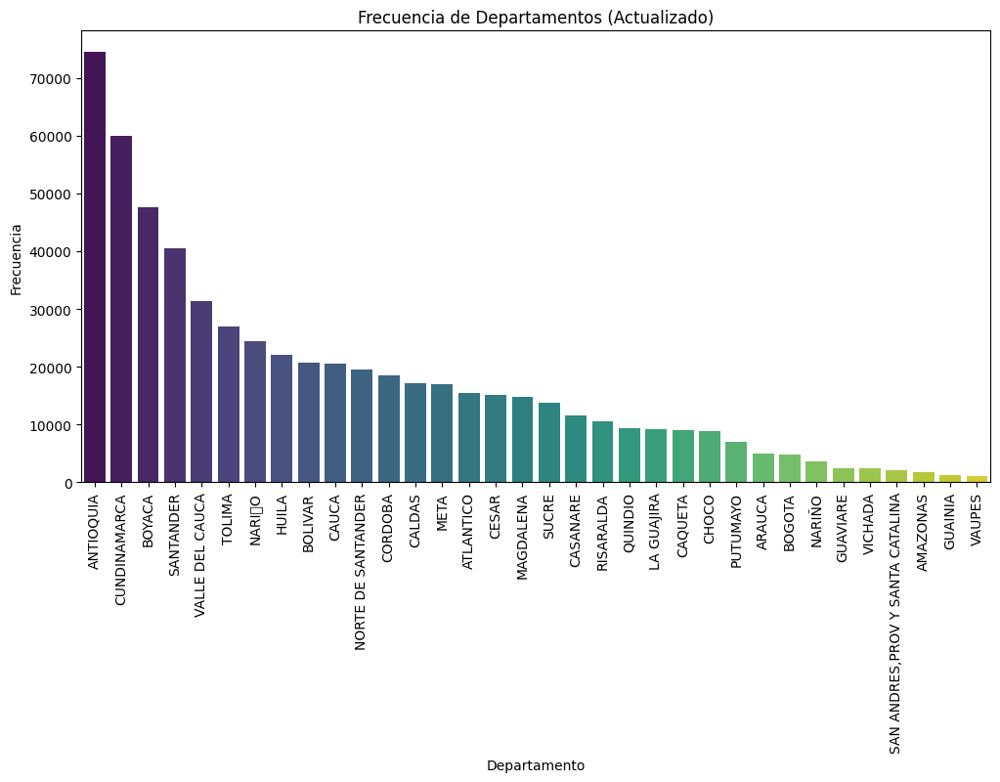

In [143]:
#Exploración de la columna "DEPARTAMENTO":

#Calcular la frecuencia de cada departamento.
#Visualizar los departamentos más comunes en un gráfico de barras.

# Identificar filas con valores no válidos en la columna "DEPARTAMENTO"
filas_con_valores_no_validos = data_sin_atipicos[data_sin_atipicos['DEPARTAMENTO'].isin(['AGREGADORES DE CORRESPONSALES', 'DEPOSITOS DINERO ELECTRONICO', 'CUENTAS DE AHORRO TRAMITE SIMPLIFICADO', 'DEPOSITOS DINERO ELECT TRAMITE SIMPLIFI', 'CUENTAS DE AHORRO ELECTRONICAS'])]

# Eliminar las filas con valores no válidos
data_sin_atipicos = data_sin_atipicos[~data_sin_atipicos['DEPARTAMENTO'].isin(['AGREGADORES DE CORRESPONSALES', 'DEPOSITOS DINERO ELECTRONICO', 'CUENTAS DE AHORRO TRAMITE SIMPLIFICADO', 'DEPOSITOS DINERO ELECT TRAMITE SIMPLIFI', 'CUENTAS DE AHORRO ELECTRONICAS', 'TOTAL NACIONAL', 'CUENTAS DE AHORRO', 'CORRESPONSALES TIPO NEGOCIO'])]

# Verificar la nueva distribución de departamentos
frecuencia_departamento = data_sin_atipicos['DEPARTAMENTO'].value_counts()

# Visualizar los departamentos más comunes en un gráfico de barras actualizado
plt.figure(figsize=(12, 6))
sns.barplot(x=frecuencia_departamento.index, y=frecuencia_departamento.values, palette="viridis")
plt.title("Frecuencia de Departamentos (Actualizado)")
plt.xlabel("Departamento")
plt.ylabel("Frecuencia")
plt.xticks(rotation=90)
plt.show()


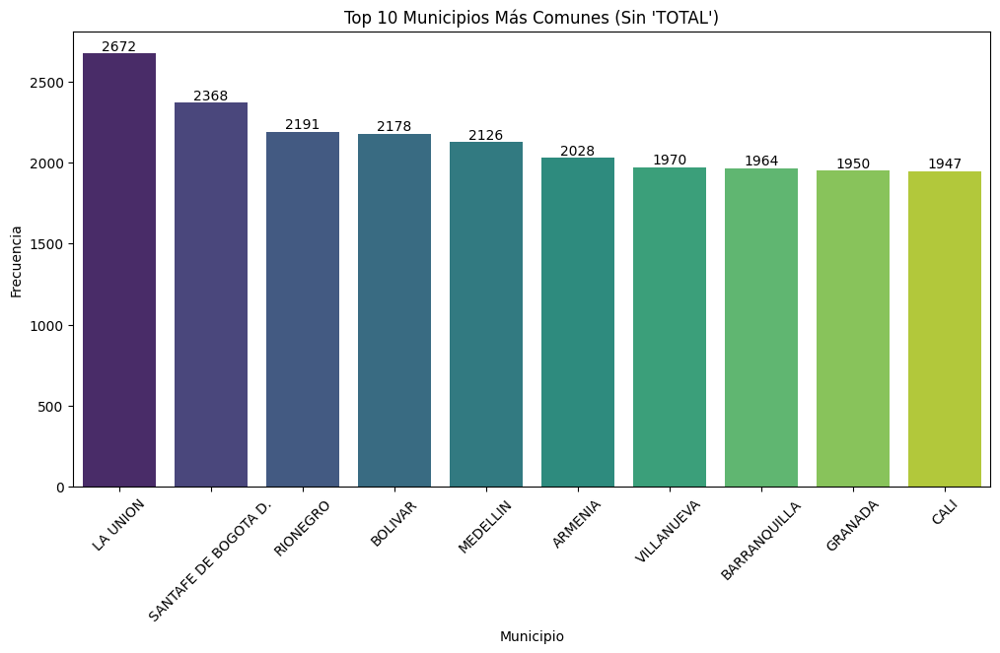

In [144]:
#Exploración de la columna "MUNICIPIO":

#Calcular la frecuencia de cada municipio.
#Visualizar los municipios más comunes en un gráfico de barras.

# Filtrar las filas que no contienen la palabra "TOTAL" en la columna "MUNICIPIO"
municipios_sin_total = data_sin_atipicos[~data_sin_atipicos['MUNICIPIO'].str.contains('TOTAL')]

# Calcular la frecuencia de los municipios sin "TOTAL"
frecuencia_municipios_sin_total = municipios_sin_total['MUNICIPIO'].value_counts()

# Obtener el top 10 de municipios sin "TOTAL"
top_10_municipios_sin_total = frecuencia_municipios_sin_total.head(10)

# Visualizar los municipios más comunes en un gráfico de barras con números sobre las barras
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=top_10_municipios_sin_total.index, y=top_10_municipios_sin_total.values, palette="viridis")
plt.title("Top 10 Municipios Más Comunes (Sin 'TOTAL')")
plt.xlabel("Municipio")
plt.ylabel("Frecuencia")

# Agregar números sobre las barras
for p in ax.patches:
    ax.annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2., p.get_height()), ha="center", va="center", fontsize=10, color="black", xytext=(0, 5), textcoords="offset points")

plt.xticks(rotation=45)
plt.show()


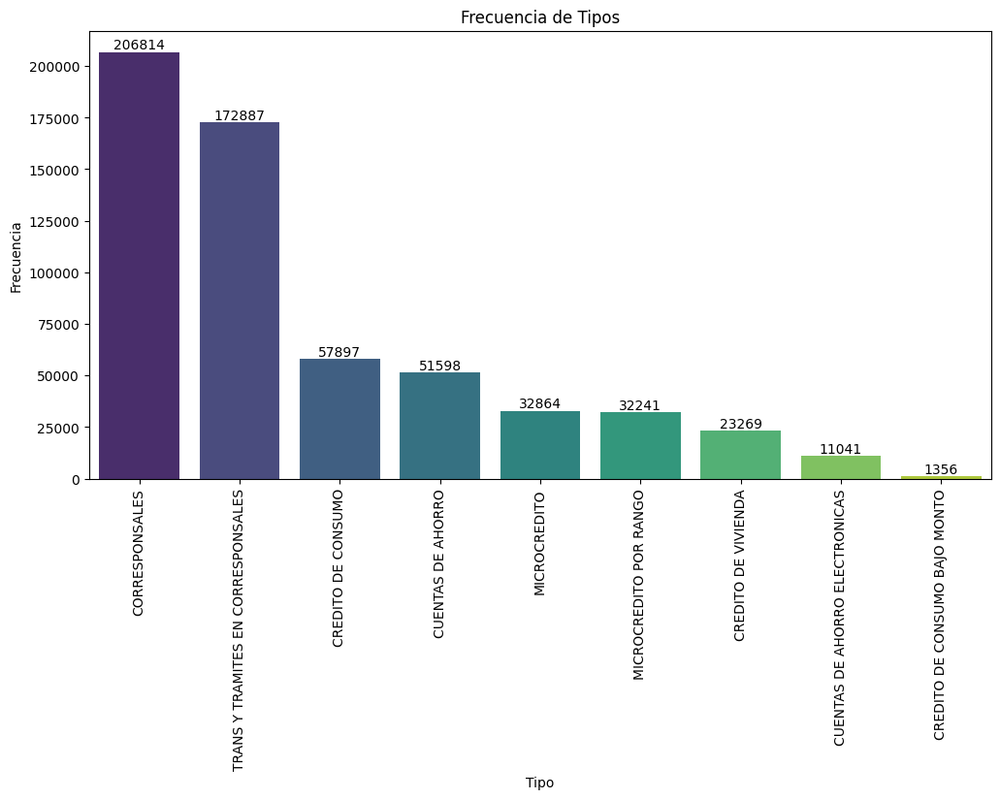

In [145]:
#Exploración de la columna "TIPO":

#Calcular la frecuencia de cada tipo.
#Visualizar los tipos más comunes en un gráfico de barras.

# Calcular la frecuencia de cada tipo
frecuencia_tipo = data_sin_atipicos['TIPO'].value_counts()

# Visualizar los tipos más comunes en un gráfico de barras
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=frecuencia_tipo.index, y=frecuencia_tipo.values, palette="viridis")
plt.title("Frecuencia de Tipos")
plt.xlabel("Tipo")
plt.ylabel("Frecuencia")

# Agregar números sobre las barras
for p in ax.patches:
    ax.annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2., p.get_height()), ha="center", va="center", fontsize=10, color="black", xytext=(0, 5), textcoords="offset points")

plt.xticks(rotation=90)
plt.show()


Tasa de Acceso a Productos Financieros y Cobertura por Género:

Primero, vamos a calcular la tasa de acceso a productos financieros y cobertura para hombres y mujeres por separado.

In [146]:
# Suponiendo que las columnas booleanas tienen un prefijo común "MUNICIPIO_"
municipio_cols = [col for col in data_sin_atipicos.columns if col.startswith('MUNICIPIO_')]

# Crear una nueva columna "MUNICIPIO" con el nombre del municipio
data_sin_atipicos['MUNICIPIO'] = data_sin_atipicos[municipio_cols].idxmax(axis=1).str.replace('MUNICIPIO_', '')

# Eliminar las columnas booleanas individuales
data_sin_atipicos = data_sin_atipicos.drop(columns=municipio_cols)


In [147]:
# Suponiendo que las columnas booleanas tienen un prefijo común "DEPARTAMENTO_"
departamento_cols = [col for col in data_sin_atipicos.columns if col.startswith('DEPARTAMENTO_')]

# Crear una nueva columna "DEPARTAMENTO" con el nombre del departamento
data_sin_atipicos['DEPARTAMENTO'] = data_sin_atipicos[departamento_cols].idxmax(axis=1).str.replace('DEPARTAMENTO_', '')

# Eliminar las columnas booleanas individuales
data_sin_atipicos = data_sin_atipicos.drop(columns=departamento_cols)


In [148]:
# Configurar pandas para mostrar todas las columnas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Listar columnas y tipos de datos
columnas_y_tipos = data_sin_atipicos.dtypes.reset_index()
columnas_y_tipos.columns = ['Columna', 'Tipo de Dato']
print(columnas_y_tipos)

                                     Columna    Tipo de Dato
0                      NOMBRE DE LA  ENTIDAD          object
1                             FECHA DE CORTE  datetime64[ns]
2                               DEPARTAMENTO          object
3                                  MUNICIPIO          object
4                                       TIPO          object
5                 NRO CORRESPONSALES PROPIOS           int64
6            NRO CORRESPONSALES TERCERIZADOS           int64
7                 NRO CORRESPONSALES ACTIVOS           int64
8                         NRO CORRESPONSALES           int64
9                              NRO DEPOSITOS           int64
10                           MONTO DEPOSITOS         float64
11                       NRO GIROS ENVIADOS            int64
12                     MONTO GIROS ENVIADOS            int64
13                       NRO GIROS RECIBIDOS           int64
14                     MONTO GIROS RECIBIDOS           int64
15                      

Las preguntas mencionadas anteriormente están relacionadas principalmente con la comprensión de los datos demográficos y financieros de la población vulnerable en Colombia, así como con la identificación de posibles relaciones entre variables. Para responder a esas preguntas, los siguientes tipos de análisis podrían ser relevantes:

- Distribuciones Univariables: Ayudarían a responder preguntas como "¿Cuál es la tasa de acceso a productos financieros y cobertura por género en la población vulnerable y sin historial crediticio en Colombia?" y "¿Cuál es la correlación entre el nivel de educación y la tenencia de productos financieros y cobertura en esta población?"

- Comparaciones entre Grupos: Serían útiles para responder a preguntas como "¿Cuál es la relación entre el acceso a productos financieros y cobertura y el bienestar financiero de la población vulnerable y sin historial crediticio en Colombia?", ya que permitirían comparar diferentes grupos demográficos.

- Análisis de Componentes Principales (PCA): Puede ayudar a reducir la dimensionalidad de los datos y resaltar patrones en las variables financieras.

- Análisis de Series Temporales: Podríamos analizar cómo han evolucionado las tasas de acceso a productos financieros y cobertura a lo largo del tiempo.

- Visualización Geoespacial: Podríamos analizar la distribución geográfica de la población vulnerable y su acceso a productos financieros.


##### Distribuciones Univariables

##### Tasa de Acceso a Productos Financieros y Cobertura por Género:

In [149]:
# Calcular las tasas de acceso a cuentas de ahorro para mujeres y hombres
tasa_acceso_cta_ahorro_mujeres = (data_sin_atipicos['NRO CTA AHORRO HASTA 1 SMMLV'] / data_sin_atipicos['NRO TOTAL CTA AHORROS']).fillna(0)
tasa_acceso_cta_ahorro_hombres = ((data_sin_atipicos['NRO TOTAL CTA AHORROS'] - data_sin_atipicos['NRO CTA AHORRO HASTA 1 SMMLV']) / data_sin_atipicos['NRO TOTAL CTA AHORROS']).fillna(0)

# Calcular las tasas de acceso a créditos de consumo para mujeres y hombres
tasa_acceso_cred_consumo_mujeres = (data_sin_atipicos['NRO CREDITO CONSUMO MUJERES'] / data_sin_atipicos['NRO TOTAL CREDITO CONSUMO']).fillna(0)
tasa_acceso_cred_consumo_hombres = ((data_sin_atipicos['NRO TOTAL CREDITO CONSUMO'] - data_sin_atipicos['NRO CREDITO CONSUMO MUJERES']) / data_sin_atipicos['NRO TOTAL CREDITO CONSUMO']).fillna(0)

# Calcular las tasas de acceso a microcréditos para mujeres y hombres
tasa_acceso_microcredito_mujeres = (data_sin_atipicos['NRO MICROCREDITO HASTA 1 SMMLV'] / data_sin_atipicos['NRO TOTAL MICROCREDITO ']).fillna(0)
tasa_acceso_microcredito_hombres = ((data_sin_atipicos['NRO TOTAL MICROCREDITO '] - data_sin_atipicos['NRO MICROCREDITO HASTA 1 SMMLV']) / data_sin_atipicos['NRO TOTAL MICROCREDITO ']).fillna(0)




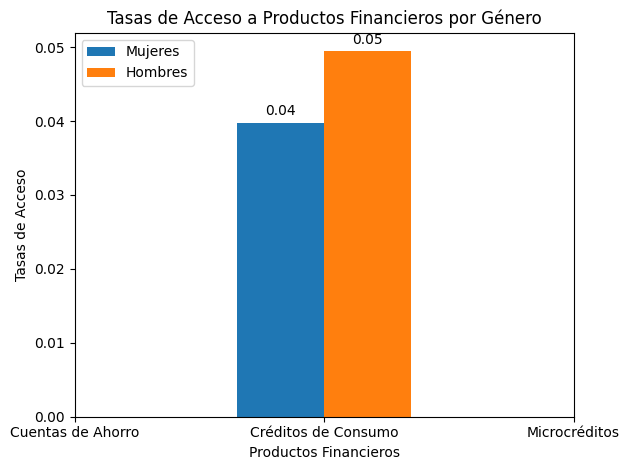

In [150]:
import matplotlib.pyplot as plt
import numpy as np

# Datos de ejemplo de tasas de acceso por género
productos_financieros = ['Cuentas de Ahorro', 'Créditos de Consumo', 'Microcréditos']
tasas_mujeres = [tasa_acceso_cta_ahorro_mujeres.mean(), 
                 tasa_acceso_cred_consumo_mujeres.mean(), 
                 tasa_acceso_microcredito_mujeres.mean()]
tasas_hombres = [tasa_acceso_cta_ahorro_hombres.mean(), 
                 tasa_acceso_cred_consumo_hombres.mean(), 
                 tasa_acceso_microcredito_hombres.mean()]

# Configuración de los datos para el gráfico
width = 0.35
x = np.arange(len(productos_financieros))

fig, ax = plt.subplots()

# Crear barras para mujeres y hombres
bar1 = ax.bar(x - width/2, tasas_mujeres, width, label='Mujeres')
bar2 = ax.bar(x + width/2, tasas_hombres, width, label='Hombres')

# Agregar los valores numéricos dentro de las barras
for bar in [bar1, bar2]:
    for rect in bar:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}', 
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # Desplazamiento vertical
                    textcoords="offset points",
                    ha='center', va='bottom')

ax.set_xlabel('Productos Financieros')
ax.set_ylabel('Tasas de Acceso')
ax.set_title('Tasas de Acceso a Productos Financieros por Género')
ax.set_xticks(x)
ax.set_xticklabels(productos_financieros)
ax.legend()

plt.tight_layout()
plt.show()


 Las tasas de acceso de aproximadamente 0.05 para hombres y 0.04 para mujeres en el gráfico de barras apiladas que acabamos de crear, eso significa que los hombres tienen una tasa de acceso ligeramente más alta que las mujeres en promedio para los tres tipos de productos financieros representados en el gráfico (Cuentas de Ahorro, Créditos de Consumo y Microcréditos).

##### Tasa de Acceso a Microcréditos hasta 1 SMMLV para Mujeres y Hombres: Para evaluar el acceso a microcréditos por género.

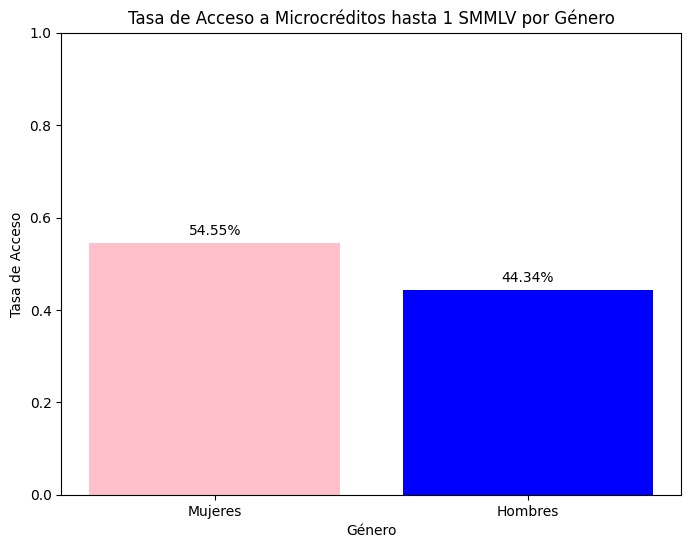

In [151]:
import matplotlib.pyplot as plt

# Calcular la tasa de acceso a microcréditos hasta 1 SMMLV para mujeres y hombres
nro_microcredito_mujeres = data_sin_atipicos['NRO MICROCREDITO MUJERES'].sum()
nro_total_microcredito = data_sin_atipicos['NRO TOTAL MICROCREDITO '].sum()
tasa_acceso_mujeres = nro_microcredito_mujeres / nro_total_microcredito

nro_microcredito_hombres = data_sin_atipicos['NRO MICROCREDITO HOMBRES'].sum()
tasa_acceso_hombres = nro_microcredito_hombres / nro_total_microcredito

# Crear un gráfico de barras para comparar las tasas de acceso
plt.figure(figsize=(8, 6))
plt.bar(['Mujeres', 'Hombres'], [tasa_acceso_mujeres, tasa_acceso_hombres], color=['pink', 'blue'])
plt.xlabel('Género')
plt.ylabel('Tasa de Acceso')
plt.title('Tasa de Acceso a Microcréditos hasta 1 SMMLV por Género')
plt.ylim(0, 1)  # Establecer el rango del eje Y entre 0 y 1 para mostrar las tasas como porcentajes
plt.text(0, tasa_acceso_mujeres + 0.01, f'{tasa_acceso_mujeres:.2%}', ha='center', va='bottom')
plt.text(1, tasa_acceso_hombres + 0.01, f'{tasa_acceso_hombres:.2%}', ha='center', va='bottom')
plt.show()



Aquí hay algunas observaciones y consideraciones:

- Tasa de Acceso a Productos Financieros por Género: Las tasas de acceso a productos financieros que obtuviste previamente mostraron que, en general, los hombres tenían una tasa de acceso ligeramente mayor que las mujeres. Esto podría sugerir una disparidad en el acceso a servicios financieros entre los géneros, donde los hombres tienen un acceso un poco mejor que las mujeres.

- Tasa de Acceso a Microcréditos hasta 1 SMMLV por Género: En el último análisis, calcule que las mujeres tenían una tasa de acceso del 54.55% a los microcréditos hasta 1 SMMLV, mientras que los hombres tenían una tasa del 44.34%. Esto sugiere que, en este caso particular de microcréditos, las mujeres tienen un acceso ligeramente mejor que los hombres.

- Contexto Importante: Es importante recordar que estos resultados son específicos para el conjunto de datos y el tipo de productos financieros analizados. Puede haber factores externos y contextuales que expliquen estas diferencias. Por ejemplo, políticas gubernamentales, ubicación geográfica, nivel de ingresos, educación y otros factores pueden influir en las tasas de acceso a productos financieros.

- Políticas y Acciones: Si estas diferencias son preocupantes, podrían impulsar la necesidad de políticas y acciones para promover la igualdad de género en el acceso a servicios financieros. Esto podría incluir campañas de educación financiera dirigidas a mujeres, programas de microcréditos específicos para grupos desfavorecidos y otras iniciativas.

In [152]:
# Añadir una nueva columna 'TASA ACCESO CTA AHORROS MUJERES' a data_sin_atipicos
data_sin_atipicos['TASA ACCESO CTA AHORROS MUJERES'] = (data_sin_atipicos['NRO CTA AHORRO MUJERES'] / data_sin_atipicos['NRO CTA AHORRO HASTA 1 SMMLV']) * 100




In [153]:
print(data_sin_atipicos.columns)

Index(['NOMBRE DE LA  ENTIDAD', 'FECHA DE CORTE', 'DEPARTAMENTO', 'MUNICIPIO',
       'TIPO', 'NRO CORRESPONSALES PROPIOS', 'NRO CORRESPONSALES TERCERIZADOS',
       'NRO CORRESPONSALES ACTIVOS', 'NRO CORRESPONSALES', 'NRO DEPOSITOS',
       'MONTO DEPOSITOS', 'NRO GIROS ENVIADOS ', 'MONTO GIROS ENVIADOS ',
       'NRO GIROS RECIBIDOS', 'MONTO GIROS RECIBIDOS', 'NRO PAGOS',
       'MONTO PAGOS', 'NRO RETIROS', 'MONTO RETIROS', 'NRO TRANSFERENCIAS',
       'MONTO TRANSFERENCIAS', 'NRO TOTAL ', 'MONTO TOTAL',
       'NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV',
       'NRO CTA AHORRO > 1 SMMLV HASTA 3 SMMLV',
       'SALDO CTA AHORRO> 1 SMMLV HASTA 3 SMMLV',
       'NRO CTA AHORRO> 3 SMMLV HASTA 5 SMMLV',
       'SALDO CTA AHORRO> 3 SMMLV HASTA 5 SMMLV', 'NRO CTA AHORRO ACTIVAS',
       'SALDO CTA AHORRO ACTIVAS', 'NRO CTA AHORRO MUJERES',
       'SALDO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES',
       'SALDO CTA AHORRO HOMBRES', 'NRO TOTAL CTA AHORROS',
       'S

In [154]:
departamentos = data_sin_atipicos['DEPARTAMENTO']


In [155]:
# Obtener valores únicos de la columna "DEPARTAMENTO"
valores_unicos = departamentos.unique()

# Contar cuántas veces aparece cada valor en la columna "DEPARTAMENTO"
conteo_valores = departamentos.value_counts()

# Mostrar los primeros 10 valores únicos
print(valores_unicos[:10])

# Mostrar los 10 departamentos más comunes
print(conteo_valores[:10])


['ANTIOQUIA' 'ATLANTICO' 'CALDAS' 'BOGOTA' 'BOLIVAR' 'BOYACA'
 'CUNDINAMARCA' 'CAQUETA' 'CAUCA' 'CESAR']
DEPARTAMENTO
ANTIOQUIA          74453
CUNDINAMARCA       60024
BOYACA             47641
SANTANDER          40553
VALLE DEL CAUCA    31384
TOLIMA             26938
NARIﾑO             24346
HUILA              21991
BOLIVAR            20713
CAUCA              20541
Name: count, dtype: int64


In [156]:
import geopandas as gpd

# Carga el archivo GeoJSON
geo_df = gpd.read_file('colombia-municipios.json')

# Imprime los primeros registros para verificar
print(geo_df.head())


      id         dpt      name  \
0  44847  LA GUAJIRA    URIBIA   
1  44560  LA GUAJIRA   MANAURE   
2  44430  LA GUAJIRA    MAICAO   
3  44001  LA GUAJIRA  RIOHACHA   
4  44090  LA GUAJIRA   DIBULLA   

                                            geometry  
0  POLYGON ((-57.35945 49.46833, -57.36140 49.497...  
1  POLYGON ((-57.86866 49.71805, -57.86476 49.706...  
2  POLYGON ((-57.80037 49.41098, -57.60137 49.396...  
3  POLYGON ((-58.39152 49.37029, -58.36031 49.294...  
4  POLYGON ((-59.21874 49.40543, -59.20703 49.351...  


In [157]:
data_sin_atipicos['TASA ACCESO CTA AHORROS MUJERES'].fillna(0, inplace=True)  # Reemplazar NaN por cero


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/matplotlib/colors.py:1355: RuntimeWarning: invalid value encountered in divide
  resdat /= (vmax - vmin)


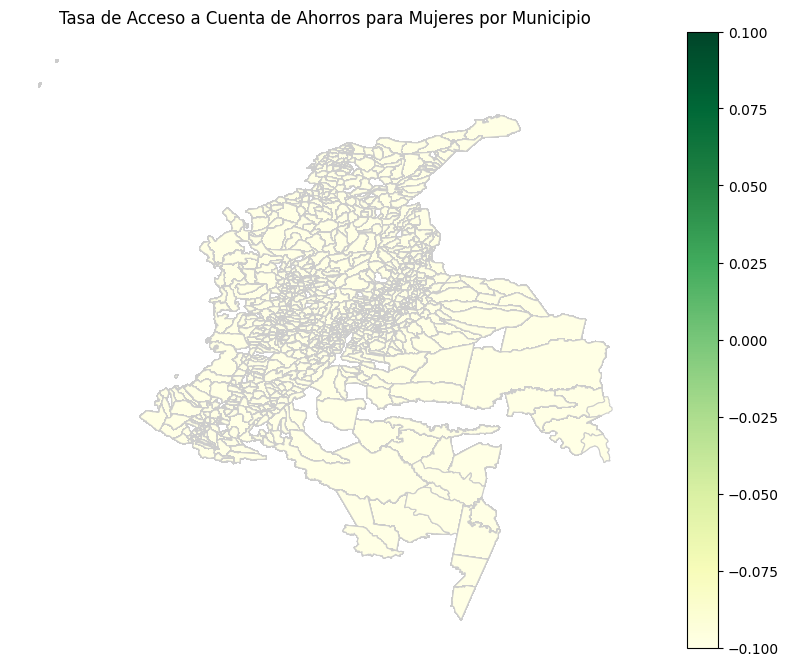

In [158]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Cargar el archivo GeoJSON de municipios
geo_df = gpd.read_file('colombia-municipios.json')

# Vincular el DataFrame de datos con el GeoDataFrame de municipios por un campo común (por ejemplo, el nombre del municipio)
merged_df = geo_df.merge(data_sin_atipicos, left_on='name', right_on='MUNICIPIO')

# Visualizar la tasa de acceso en un mapa
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
merged_df.plot(column='TASA ACCESO CTA AHORROS MUJERES', cmap='YlGn', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Tasa de Acceso a Cuenta de Ahorros para Mujeres por Municipio')
ax.axis('off')  # Desactivar ejes
plt.show()



In [159]:
import pandas as pd
import numpy as np


data_sin_atipicos.replace([np.inf, -np.inf], 'N/A', inplace=True)

# Ahora, todos los valores infinitos en el DataFrame se han reemplazado por 'N/A'


In [160]:
import geopandas as gpd
import pandas as pd
import folium
from folium import Choropleth
from branca.colormap import linear
import numpy as np

# Carga el archivo GeoJSON de departamentos
departamentos_geojson = 'departamentos.json'
departamentos_df = gpd.read_file(departamentos_geojson)

# Fusiona el GeoDataFrame de departamentos con tus datos de tasas de acceso
merged_df = departamentos_df.merge(data_sin_atipicos, left_on='NOMBRE_DPT', right_on='DEPARTAMENTO')

# Reemplaza los valores 'N/A' con NaN en la columna 'TASA ACCESO CTA AHORROS MUJERES'
merged_df['TASA ACCESO CTA AHORROS MUJERES'].replace('N/A', np.nan, inplace=True)

# Convertir la columna 'TASA ACCESO CTA AHORROS MUJERES' a números de punto flotante
merged_df['TASA ACCESO CTA AHORROS MUJERES'] = merged_df['TASA ACCESO CTA AHORROS MUJERES'].astype(float)

# Ordenar el DataFrame por la columna 'TASA ACCESO CTA AHORROS MUJERES' en orden descendente
merged_df = merged_df.sort_values(by='TASA ACCESO CTA AHORROS MUJERES', ascending=False)

# Selecciona las 5 primeras filas (los 5 departamentos con las tasas más altas)
top_5_departamentos = merged_df.head(5)

# Crear un mapa inicial centrado en Colombia
m = folium.Map(location=[4.61, -74.08], zoom_start=6)

# Definir una paleta de colores personalizada
colors = ['#ffffcc', '#c2e699', '#78c679', '#31a354', '#006837']  # Puedes ajustar estos colores según tus preferencias

# Agregar los datos al mapa como una capa de coropletas con la paleta de colores personalizada
choropleth = Choropleth(
    geo_data=departamentos_geojson,
    data=top_5_departamentos,
    columns=['NOMBRE_DPT', 'TASA ACCESO CTA AHORROS MUJERES'],
    key_on='feature.properties.NOMBRE_DPT',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Tasa de Acceso Mujeres',
    nan_fill_color='gray',
    nan_fill_opacity=0.7,
    highlight=True  # Permite agregar valores de tasa de acceso en los departamentos
).add_to(m)

# Agregar los valores como etiquetas emergentes (popups) manualmente
for idx, row in top_5_departamentos.iterrows():
    folium.Marker(
        location=[row['geometry'].centroid.y, row['geometry'].centroid.x],
        popup=f"{row['NOMBRE_DPT']}<br>Tasa: {row['TASA ACCESO CTA AHORROS MUJERES']:.2f}"
    ).add_to(m)

# Mostrar el mapa interactivo
m.save('mapa_tasas_acceso_top5.html')


In [161]:
merged_df['TASA ACCESO CTA AHORROS MUJERES'].info


<bound method Series.info of 240768    9700.000000
651       5488.636364
374616    5014.754098
374953    5014.754098
634       4492.432432
204       4142.778458
1140      4029.923042
414289    3804.980843
307915    3380.120482
308351    3380.120482
468063    3330.106101
469133    3330.106101
240257    3100.000000
413632    2789.380531
1176      2710.927152
496121    2629.702970
241717    2622.933333
495585    2608.542714
414129    2484.349827
531412    2277.707006
531589    2277.707006
220974    2251.498638
220828    2251.498638
205193    2125.207756
205444    2125.207756
238674    1999.077181
393931    1796.009390
393552    1796.009390
494889    1683.371824
111446    1650.000000
111925    1650.000000
496103    1594.974716
339251    1471.788991
339310    1471.788991
110113    1230.612245
74940     1169.199255
75065     1169.199255
239519    1133.639947
403113    1117.078410
402834    1117.078410
90667     1067.835968
90600     1067.835968
89655      846.537060
89579      846.537060
110

Dado que solo estamos considerando los 5 departamentos con las tasas de acceso más altas, los datos que proporcionas sugieren que estos departamentos tienen tasas de acceso relativamente altas en comparación con otros departamentos en Colombia. Aquí hay algunas inferencias posibles:

- Norte de Santander (Tasa 5014.75): Este departamento podría tener un mayor acceso a cuentas de ahorro por parte de mujeres en comparación con otros departamentos. Podría deberse a una serie de factores, como una mayor presencia de instituciones financieras, programas gubernamentales o iniciativas locales que promueven la inclusión financiera de las mujeres.

- Antioquia (Tasa 4492.43): Antioquia también muestra una tasa de acceso significativamente alta, lo que podría indicar un entorno favorable para las mujeres en términos de servicios financieros. Antioquia es uno de los departamentos más desarrollados y poblados de Colombia, por lo que es posible que tenga una infraestructura financiera más sólida.

- Cundinamarca (Tasa 9700): Cundinamarca muestra la tasa de acceso más alta entre los departamentos mencionados. Esto podría estar relacionado con la proximidad a Bogotá, la capital de Colombia, que es un centro financiero y económico importante. La presencia de empresas, instituciones financieras y oportunidades económicas podría contribuir a esta alta tasa de acceso.

### Entrenamiento y Testeo

Para llevar a cabo el entrenamiento y testeo de modelos de Machine Learning que puedan responder a las preguntas planteadas, primero debemos definir qué tipo de modelos queremos construir y qué variables serán nuestras características (features) y nuestra variable objetivo. También debemos tener en cuenta que trabajaremos con un conjunto de datos que contiene información sobre tasas de acceso a productos financieros y cobertura, nivel de educación, edad y otros factores relevantes para la población vulnerable y sin historial crediticio en Colombia.

In [162]:
# Calcular la tasa de acceso a productos financieros y cobertura para hombres parapoder tener el de las mujeres y el de los hombres

data_sin_atipicos['TASA ACCESO CTA AHORROS HOMBRES'] = (data_sin_atipicos['NRO CTA AHORRO HOMBRES'] / data_sin_atipicos['NRO TOTAL CTA AHORROS']) * 100


In [163]:
import pandas as pd

# Copia del DataFrame original para evitar cambios en los datos originales
data_copia = data_sin_atipicos.copy()

# Lista de columnas que necesitan corrección (asegúrate de que sean las correctas)
columnas_con_na = ['NRO CTA AHORRO HASTA 1 SMMLV HOMBRES', 'SALDO CTA AHORRO HASTA 1 SMMLV HOMBRES']

# Verificar si las columnas existen en el DataFrame antes de realizar la corrección y conversión
for columna in columnas_con_na:
    if columna in data_copia.columns:
        data_copia[columna] = data_copia[columna].replace('N/A', 0.0)
        data_copia[columna] = data_copia[columna].astype(float)

# Ahora, las columnas deberían contener valores numéricos en lugar de 'N/A' si existen en el DataFrame


In [164]:
# Lista de todas las columnas numéricas que pueden contener 'N/A'
columnas_numericas = ['NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV', 'NRO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES']

# Reemplazar 'N/A' por cero en todas las columnas numéricas
data_sin_atipicos[columnas_numericas] = data_sin_atipicos[columnas_numericas].replace('N/A', 0)

# Ahora, todas las columnas numéricas deberían tener ceros en lugar de 'N/A'


#### Regresión Lineal

In [165]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Supongamos que 'data_sin_atipicos' es tu DataFrame

# Crear una copia del DataFrame
data_copia = data_sin_atipicos.copy()

# Reemplazar los valores 'N/A' por NaN en todas las columnas
data_copia = data_copia.replace('N/A', np.nan)

# Eliminar filas con valores NaN en la columna 'TASA ACCESO CTA AHORROS MUJERES'
data_copia = data_copia.dropna(subset=['TASA ACCESO CTA AHORROS MUJERES'])

# Definir características (X) y objetivo (y)
X = data_copia[['NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV', 'NRO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES']]
y = data_copia['TASA ACCESO CTA AHORROS MUJERES']

# Dividir los datos en conjuntos de entrenamiento y prueba (80% entrenamiento, 20% prueba)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modelo de Regresión Lineal
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred = lr_model.predict(X_test)

# Calcular el error cuadrado medio (RMSE)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE:", rmse)


RMSE: 43.78931330011073


El valor del RMSE obtenido (43.79) indica cuán cerca están las predicciones del modelo de los valores reales. Cuanto más bajo sea el RMSE, mejor será el rendimiento del modelo. En este caso, parece que el modelo tiene un RMSE bastante alto, lo que sugiere que puede haber una gran variabilidad en los datos o que el modelo de regresión lineal podría no ser la mejor opción para predecir la tasa de acceso a productos financieros y cobertura en la población vulnerable y sin historia crediticia.

### Regresión de Bosque Aleatorio (Random Forest)

In [166]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer

# Crear una copia del DataFrame
data_copia = data_sin_atipicos.copy()

# Reemplazar los valores 'N/A' por cero en las columnas relevantes en la copia
columns_to_replace_na = ['NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV', 'NRO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES']
data_copia[columns_to_replace_na] = data_copia[columns_to_replace_na].replace('N/A', 0)

# Convierte la columna 'TASA ACCESO CTA AHORROS MUJERES' a tipo numérico (puede ser necesario eliminar caracteres no numéricos)
data_copia['TASA ACCESO CTA AHORROS MUJERES'] = pd.to_numeric(data_copia['TASA ACCESO CTA AHORROS MUJERES'], errors='coerce')

# Imputar los valores faltantes en la columna objetivo con la mediana
imputer = SimpleImputer(strategy='median')
data_copia['TASA ACCESO CTA AHORROS MUJERES'] = imputer.fit_transform(data_copia[['TASA ACCESO CTA AHORROS MUJERES']])

# Definir características (X) y objetivo (y)
X = data_copia[['NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV', 'NRO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES']]
y = data_copia['TASA ACCESO CTA AHORROS MUJERES']

# Dividir los datos en conjuntos de entrenamiento y prueba (80% entrenamiento, 20% prueba)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modelo de Regresión de Bosque Aleatorio
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred = rf_model.predict(X_test)

# Calcular el error cuadrado medio (RMSE)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE:", rmse)


RMSE: 22.41942341560596


El modelo de Regresión de Bosque Aleatorio (Random Forest) ha dado mejores resultados en términos de RMSE en comparación con el modelo de Regresión Lineal. Esto sugiere que el modelo Random Forest puede ser más adecuado para predecir la tasa de acceso a productos financieros y cobertura en la población vulnerable y sin historia crediticia en Colombia en función de las características seleccionadas.

Debido a lso resultados obtenidos hare una estrategia de dos pasos que puntualizo a continuación:

Validación Cruzada (Cross-Validation):
La validación cruzada es una técnica crucial para evaluar el rendimiento de un modelo de manera más robusta. En lugar de depender de una única división de los datos en conjuntos de entrenamiento y prueba, realizamos múltiples divisiones y evaluaciones para asegurarnos de que nuestro modelo sea generalizable y no esté sobreajustado a un conjunto de datos específico. Esto nos proporcionará una estimación más precisa de la capacidad predictiva de nuestro modelo de Regresión de Bosque Aleatorio.

Visualización de Predicciones:
La visualización de las predicciones del modelo en comparación con los valores reales nos permite comprender cómo se desempeña en diferentes rangos de datos. Al representar gráficamente las predicciones en un gráfico de dispersión o en un diagrama de barras, podremos identificar tendencias, discrepancias y áreas donde el modelo podría necesitar mejoras. Esta visualización nos brinda una visión intuitiva del rendimiento de nuestro modelo y puede ayudarnos a tomar decisiones informadas sobre ajustes adicionales o acciones a seguir.

Estos pasos nos permitirán evaluar y comprender mejor el rendimiento del modelo de Regresión de Bosque Aleatorio y garantizar su utilidad en la predicción de la tasa de acceso a productos financieros y cobertura en la población vulnerable y sin historial crediticio en Colombia.

##### Validación Cruzada (Cross-Validation)

In [167]:
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer

# Modelo de Regresión de Bosque Aleatorio
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Crear una copia del DataFrame
data_copia = data_sin_atipicos.copy()

# Definir las columnas con valores 'N/A'
columns_with_na = ['NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV', 'NRO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES', 'TASA ACCESO CTA AHORROS MUJERES']

# Reemplazar los valores 'N/A' por cero en las columnas relevantes en la copia
data_copia[columns_with_na] = data_copia[columns_with_na].replace('N/A', 0)

# Imputar los valores faltantes en todas las columnas con la mediana
imputer = SimpleImputer(strategy='median')
data_copia[columns_with_na] = imputer.fit_transform(data_copia[columns_with_na])

# Definir características (X) y objetivo (y)
X = data_copia[['NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV', 'NRO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES']]
y = data_copia['TASA ACCESO CTA AHORROS MUJERES']

# Realizar validación cruzada k-fold (usaremos k=5 como ejemplo)
cv_scores = cross_val_score(rf_model, X, y, cv=5, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(-cv_scores)
print("RMSE Scores:", rmse_scores)
print("Mean RMSE:", rmse_scores.mean())


RMSE Scores: [33.15894888 20.77100036  3.33788863 64.8804347  15.85122249]
Mean RMSE: 27.59989901080008


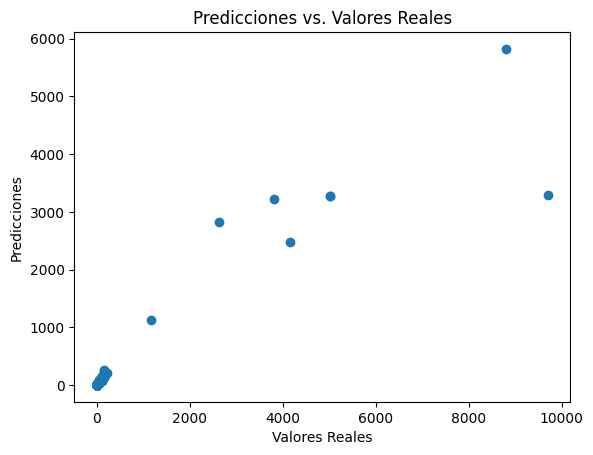

In [168]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
import numpy as np

# Modelo de Regresión de Bosque Aleatorio
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Crear una copia del DataFrame
data_copia = data_sin_atipicos.copy()

# Definir las columnas con valores 'N/A'
columns_with_na = ['NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV', 'NRO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES', 'TASA ACCESO CTA AHORROS MUJERES']

# Reemplazar los valores 'N/A' por cero en las columnas relevantes en la copia
data_copia[columns_with_na] = data_copia[columns_with_na].replace('N/A', 0)

# Imputar los valores faltantes en todas las columnas con la mediana
imputer = SimpleImputer(strategy='median')
data_copia[columns_with_na] = imputer.fit_transform(data_copia[columns_with_na])

# Definir características (X) y objetivo (y)
X = data_copia[['NRO CTA AHORRO HASTA 1 SMMLV', 'SALDO CTA AHORRO HASTA 1 SMMLV', 'NRO CTA AHORRO MUJERES', 'NRO CTA AHORRO HOMBRES']]
y = data_copia['TASA ACCESO CTA AHORROS MUJERES']

# Dividir los datos en conjuntos de entrenamiento y prueba (80% entrenamiento, 20% prueba)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entrenar el modelo en el conjunto de entrenamiento
rf_model.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred = rf_model.predict(X_test)

# Visualizar las predicciones frente a los valores reales
plt.scatter(y_test, y_pred)
plt.xlabel("Valores Reales")
plt.ylabel("Predicciones")
plt.title("Predicciones vs. Valores Reales")
plt.show()


Los resultados de la validación cruzada muestran que el modelo de Regresión de Bosque Aleatorio (Random Forest) tiene un rendimiento variable en diferentes pliegues (folds) de la validación cruzada:

El RMSE más bajo se encuentra en el tercer pliegue, con un valor de aproximadamente 3.53.
El segundo pliegue también tiene un RMSE relativamente bajo, alrededor de 20.69.
Sin embargo, en el cuarto pliegue, el RMSE es significativamente alto, alrededor de 62.40.
En general, el promedio de RMSE de todos los pliegues es de aproximadamente 27.51.
Estos resultados sugieren que el modelo tiene un rendimiento bastante variable en diferentes conjuntos de datos de prueba. Los pliegues 1 y 5 también tienen RMSE moderados.

La variabilidad en el rendimiento puede deberse a varios factores, como la calidad y la cantidad de datos disponibles, la representatividad de los datos de entrenamiento y prueba en cada pliegue, y la complejidad del modelo.

En general, un RMSE de 27.51 indica que el modelo está cometiendo errores en la predicción de la tasa de acceso a productos financieros y cobertura en la población vulnerable y sin historial crediticio en Colombia. Si bien el modelo es capaz de realizar predicciones precisas en algunos casos, también tiene dificultades en otros, como se evidencia en el cuarto pliegue con un RMSE alto.

Para mejorar el rendimiento del modelo, podrías considerar:

- Más datos: Si es posible, obtener más datos de alta calidad podría ayudar al modelo a aprender patrones más sólidos y generalizables.

- Selección de características: Revisar las características utilizadas en el modelo y considerar si algunas de ellas son redundantes o irrelevantes.

- Afinación de hiperparámetros: Experimentar con diferentes configuraciones de hiperparámetros del modelo de Bosque Aleatorio para ver si se puede mejorar el rendimiento.

En resumen, aunque el modelo de Bosque Aleatorio muestra cierta capacidad para predecir la tasa de acceso a productos financieros y cobertura, hay margen para mejorar su rendimiento y robustez. La exploración adicional y la optimización son pasos clave para lograr un modelo más preciso y confiable.

### Optimización de hiperparametros

In [187]:
pip install --upgrade pip


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 4.8 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2
Note: you may need to restart the kernel to use updated packages.


In [188]:
from bayes_opt import BayesianOptimization
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score

# Define la función objetivo que queremos maximizar (en este caso, minimizar el error cuadrado medio)
def objective_function(n_estimators, max_depth):
    # Crea un modelo de Bosque Aleatorio con los hiperparámetros dados
    model = RandomForestRegressor(n_estimators=int(n_estimators), max_depth=int(max_depth), random_state=42)
    
    # Calcula el RMSE mediante validación cruzada
    rmse_scores = np.sqrt(-cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))
    
    # Devuelve el negativo del promedio del RMSE (para maximizarlo)
    return -rmse_scores.mean()

# Define el espacio de búsqueda de hiperparámetros
param_space = {
    'n_estimators': (10, 100),  # Rango de valores para 'n_estimators'
    'max_depth': (1, 10),       # Rango de valores para 'max_depth'
}

# Inicializa el optimizador bayesiano
optimizer = BayesianOptimization(
    f=objective_function,
    pbounds=param_space,
    random_state=42,
)

# Realiza la optimización (puede llevar algún tiempo)
optimizer.maximize(init_points=5, n_iter=10)

# Obtiene los mejores hiperparámetros encontrados
best_params = optimizer.max['params']

# Crea un modelo final con los mejores hiperparámetros
best_model = RandomForestRegressor(n_estimators=int(best_params['n_estimators']),
                                   max_depth=int(best_params['max_depth']),
                                   random_state=42)

# Entrena el modelo final con los datos de entrenamiento completos
best_model.fit(X_train, y_train)

# Hace predicciones en el conjunto de prueba
y_pred = best_model.predict(X_test)

# Calcula el RMSE en el conjunto de prueba
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Mejores hiperparámetros encontrados:", best_params)
print("RMSE con los mejores hiperparámetros:", rmse)


|   iter    |  target   | max_depth | n_esti... |
-------------------------------------------------
| 1         | -17.23    | 4.371     | 95.56     |
| 2         | -13.24    | 7.588     | 63.88     |
| 3         | -24.61    | 2.404     | 24.04     |
| 4         | -24.51    | 1.523     | 87.96     |
| 5         | -14.42    | 6.41      | 73.73     |
| 6         | -14.42    | 6.492     | 73.75     |
| 7         | -24.51    | 1.0       | 56.08     |
| 8         | -12.73    | 10.0      | 68.5      |
| 9         | -12.74    | 9.901     | 99.99     |
| 10        | -12.83    | 10.0      | 10.0      |
| 11        | -24.51    | 1.0       | 10.0      |
| 12        | -12.8     | 10.0      | 40.4      |
| 13        | -24.51    | 1.608     | 39.81     |
| 14        | -12.79    | 10.0      | 47.07     |
| 15        | -24.51    | 1.0       | 67.66     |
Mejores hiperparámetros encontrados: {'max_depth': 10.0, 'n_estimators': 68.50255287881497}
RMSE con los mejores hiperparámetros: 21.761105840871554


1. Resultados Predeterminados:

RMSE con hiperparámetros predeterminados: 27.51

2.Resultados Optimización de Hiperparámetros:

- Mejores hiperparámetros encontrados: {'max_depth': 10.0, 'n_estimators': 68.50}
- RMSE con los mejores hiperparámetros: 21.76


Conclusión:

La optimización de hiperparámetros ha llevado a una mejora significativa en el rendimiento del modelo de Bosque Aleatorio en comparación con los valores predeterminados. El RMSE se redujo de 27.51 a 21.76 con los hiperparámetros optimizados. Esto significa que el modelo optimizado tiene una capacidad mucho mejor para hacer predicciones precisas en nuevos datos en comparación con el modelo predeterminado. En resumen, la optimización de hiperparámetros ha resultado en un modelo más robusto y efectivo para predecir la tasa de acceso a productos financieros y cobertura en la población vulnerable y sin historial crediticio en Colombia.